## Project- Supplier Segmentation using RFM Analysis 

In [ ]:
#RFM stands for Recency, Frequency, and Monetary — a customer segmentation technique used in marketing and
#analytics to understand and categorize customers based on their buying behavior.

In [2]:
'''Component	Meaning
Recency (R)	    How recently a customer made a purchase.
Frequency (F)	How often the customer makes a purchase.
Monetary (M)	How much money the customer spends (total purchase value).'''

'Component\tMeaning\nRecency (R)\t    How recently a customer made a purchase.\nFrequency (F)\tHow often the customer makes a purchase.\nMonetary (M)\tHow much money the customer spends (total purchase value).'

In [3]:
# importing basic libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [4]:
os.getcwd()

'C:\\Users\\hp\\29_MAY_2025\\CASE_STUDY_6_RFM_ALL'

In [5]:
df = pd.read_csv('retail_warehouse_data.csv')
df.head()

,YEAR,MONTH,SUPPLIER,ITEM CODE,ITEM DESCRIPTION,ITEM TYPE,RETAIL SALES,RETAIL TRANSFERS,WAREHOUSE SALES
0,2020,1,REPUBLIC NATIONAL DISTRIBUTING CO,100009,BOOTLEG RED - 750ML,WINE,0.00,0.0,2.0
1,2020,1,PWSWN INC,100024,MOMENT DE PLAISIR - 750ML,WINE,0.00,1.0,4.0
2,2020,1,RELIABLE CHURCHILL LLLP,1001,S SMITH ORGANIC PEAR CIDER - 18.7OZ,BEER,0.00,0.0,1.0
3,2020,1,LANTERNA DISTRIBUTORS INC,100145,SCHLINK HAUS KABINETT - 750ML,WINE,0.00,0.0,1.0
4,2020,1,DIONYSOS IMPORTS INC,100293,SANTORINI GAVALA WHITE - 750ML,WINE,0.82,0.0,0.0


In [6]:
df.shape

(30000, 9)

In [7]:
df.columns

Index(['YEAR', 'MONTH', 'SUPPLIER', 'ITEM CODE', 'ITEM DESCRIPTION',
       'ITEM TYPE', 'RETAIL SALES', 'RETAIL TRANSFERS', 'WAREHOUSE SALES'],
      dtype='object')

In [8]:
df.duplicated().sum()

0

In [9]:
df.isnull().sum()

YEAR                 0
MONTH                0
SUPPLIER            33
ITEM CODE            0
ITEM DESCRIPTION     0
ITEM TYPE            0
RETAIL SALES         1
RETAIL TRANSFERS     0
WAREHOUSE SALES      0
dtype: int64

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   YEAR              30000 non-null  int64  
 1   MONTH             30000 non-null  int64  
 2   SUPPLIER          29967 non-null  object 
 3   ITEM CODE         30000 non-null  object 
 4   ITEM DESCRIPTION  30000 non-null  object 
 5   ITEM TYPE         30000 non-null  object 
 6   RETAIL SALES      29999 non-null  float64
 7   RETAIL TRANSFERS  30000 non-null  float64
 8   WAREHOUSE SALES   30000 non-null  float64
dtypes: float64(3), int64(2), object(4)
memory usage: 2.1+ MB


In [11]:
df.describe()

,YEAR,MONTH,RETAIL SALES,RETAIL TRANSFERS,WAREHOUSE SALES
count,30000.0,30000.000000,29999.000000,30000.000000,30000.000000
mean,2020.0,3.911467,6.939796,6.594058,27.431031
std,0.0,2.836788,33.081054,27.879428,272.166085
min,2020.0,1.000000,-0.420000,-6.000000,-3999.000000
25%,2020.0,1.000000,0.000000,0.000000,0.000000
50%,2020.0,3.000000,0.160000,0.000000,1.000000
75%,2020.0,7.000000,2.920000,3.000000,6.000000
max,2020.0,9.000000,2739.000000,1507.000000,18317.000000


In [12]:
'''
YEAR: All records are from the year 2020, so no time variation across years.
MONTH: Data spans January to September, with more entries in early months.

RETAIL SALES:
Has 1 missing value (count = 29999 vs. 30000)
Wide range: from -0.42 to 2739.0, indicating:
Some negative values, which may represent returns, refunds, or data errors.
Very high outliers (2739 is much larger than Q3 = 2.92).
Mean (6.93) > 75% (2.92): confirms presence of right-skewed distribution.

RETAIL TRANSFERS
Range: -6.0 to 1507.0, again with negative values possibly being returns/adjustments.
50% (median) = 0.0 → Most transfers are either zero or very low.
Skewed: Mean > 75%, so likely has a few large positive outliers.

WAREHOUSE SALES
Range: -3999.0 to 18317.0 — very wide and extreme outliers present.
Median = 1.0, but mean = 27.43 → highly right-skewed with few large values.
Negative values (as low as -3999) are significant and may represent:
Returns
Corrections
Data entry errors (worth investigating)

RETAIL SALES: Mostly low values with few extreme outliers and 1 missing value.

RETAIL TRANSFERS: Majority are zero, with some large positive outliers and small negatives.

WAREHOUSE SALES: Highly skewed with extreme negative and positive outliers.'''

'\nYEAR: All records are from the year 2020, so no time variation across years.\nMONTH: Data spans January to September, with more entries in early months.\n\nRETAIL SALES:\nHas 1 missing value (count = 29999 vs. 30000)\nWide range: from -0.42 to 2739.0, indicating:\nSome negative values, which may represent returns, refunds, or data errors.\nVery high outliers (2739 is much larger than Q3 = 2.92).\nMean (6.93) > 75% (2.92): confirms presence of right-skewed distribution.\n\nRETAIL TRANSFERS\nRange: -6.0 to 1507.0, again with negative values possibly being returns/adjustments.\n50% (median) = 0.0 → Most transfers are either zero or very low.\nSkewed: Mean > 75%, so likely has a few large positive outliers.\n\nWAREHOUSE SALES\nRange: -3999.0 to 18317.0 — very wide and extreme outliers present.\nMedian = 1.0, but mean = 27.43 → highly right-skewed with few large values.\nNegative values (as low as -3999) are significant and may represent:\nReturns\nCorrections\nData entry errors (worth i

In [13]:
df.dropna(how='all')

,YEAR,MONTH,SUPPLIER,ITEM CODE,ITEM DESCRIPTION,ITEM TYPE,RETAIL SALES,RETAIL TRANSFERS,WAREHOUSE SALES
0,2020,1,REPUBLIC NATIONAL DISTRIBUTING CO,100009,BOOTLEG RED - 750ML,WINE,0.00,0.0,2.0
1,2020,1,PWSWN INC,100024,MOMENT DE PLAISIR - 750ML,WINE,0.00,1.0,4.0
2,2020,1,RELIABLE CHURCHILL LLLP,1001,S SMITH ORGANIC PEAR CIDER - 18.7OZ,BEER,0.00,0.0,1.0
3,2020,1,LANTERNA DISTRIBUTORS INC,100145,SCHLINK HAUS KABINETT - 750ML,WINE,0.00,0.0,1.0
4,2020,1,DIONYSOS IMPORTS INC,100293,SANTORINI GAVALA WHITE - 750ML,WINE,0.82,0.0,0.0
...,...,...,...,...,...,...,...,...,...
29995,2020,3,"THE COUNTRY VINTNER, LLC DBA WINEBOW",352322,FORTALEZA ANEJO TEQUILA - 750ML,LIQUOR,0.33,0.0,0.0
29996,2020,3,OSLO ENTERPRISE,352324,DOMAINE BRICHOT BLANC - 750ML,WINE,0.00,0.0,0.0
29997,2020,3,OPICI FAMILY DISTRIBUTING OF MD,352354,LOTE 44 MALBEC - 750ML,WINE,0.00,0.0,6.0
29998,2020,3,CAMPARI AMERICA LLC,35238,SKYY VODKA - 1.75L,LIQUOR,329.04,302.0,0.0


In [14]:
df.shape

(30000, 9)

In [15]:
df.isnull().sum()

YEAR                 0
MONTH                0
SUPPLIER            33
ITEM CODE            0
ITEM DESCRIPTION     0
ITEM TYPE            0
RETAIL SALES         1
RETAIL TRANSFERS     0
WAREHOUSE SALES      0
dtype: int64

In [16]:
#import klib

In [17]:
df.columns = df.columns.str.replace(" ", "_", regex=False)
df.columns

Index(['YEAR', 'MONTH', 'SUPPLIER', 'ITEM_CODE', 'ITEM_DESCRIPTION',
       'ITEM_TYPE', 'RETAIL_SALES', 'RETAIL_TRANSFERS', 'WAREHOUSE_SALES'],
      dtype='object')

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   YEAR              30000 non-null  int64  
 1   MONTH             30000 non-null  int64  
 2   SUPPLIER          29967 non-null  object 
 3   ITEM_CODE         30000 non-null  object 
 4   ITEM_DESCRIPTION  30000 non-null  object 
 5   ITEM_TYPE         30000 non-null  object 
 6   RETAIL_SALES      29999 non-null  float64
 7   RETAIL_TRANSFERS  30000 non-null  float64
 8   WAREHOUSE_SALES   30000 non-null  float64
dtypes: float64(3), int64(2), object(4)
memory usage: 2.1+ MB


In [19]:
#df = df.apply(pd.to_numeric, downcast='integer')
#df = df.apply(lambda col: col.astype('int8') if pd.api.types.is_integer_dtype(col) and col.min() >= -128 and col.max() <= 127 else col)

In [20]:
#df = df.apply(lambda col: col.astype('category') if col.dtypes == 'object' else col)

In [21]:
#df = df.apply(lambda col: pd.to_numeric(col, downcast='float') if pd.api.types.is_float_dtype(col) else col)

In [22]:
#df.info()

In [23]:
#DATA CLEANING

In [24]:
df.isnull().sum()

YEAR                 0
MONTH                0
SUPPLIER            33
ITEM_CODE            0
ITEM_DESCRIPTION     0
ITEM_TYPE            0
RETAIL_SALES         1
RETAIL_TRANSFERS     0
WAREHOUSE_SALES      0
dtype: int64

In [25]:
df['SUPPLIER']=df['SUPPLIER'].fillna("UNKNOWN")
df['SUPPLIER']
#df['SUPPLIER'].fillna('UNKNOWN', inplace=True)

0           REPUBLIC NATIONAL DISTRIBUTING CO
1                                   PWSWN INC
2                     RELIABLE CHURCHILL LLLP
3                   LANTERNA DISTRIBUTORS INC
4                        DIONYSOS IMPORTS INC
                         ...                 
29995    THE COUNTRY VINTNER, LLC DBA WINEBOW
29996                         OSLO ENTERPRISE
29997         OPICI FAMILY DISTRIBUTING OF MD
29998                     CAMPARI AMERICA LLC
29999    THE COUNTRY VINTNER, LLC DBA WINEBOW
Name: SUPPLIER, Length: 30000, dtype: object

In [26]:
m=df['RETAIL_SALES'].median()
m

0.16

In [27]:
df['RETAIL_SALES'].fillna(m, inplace=True)

In [28]:
df.isnull().sum()

YEAR                0
MONTH               0
SUPPLIER            0
ITEM_CODE           0
ITEM_DESCRIPTION    0
ITEM_TYPE           0
RETAIL_SALES        0
RETAIL_TRANSFERS    0
WAREHOUSE_SALES     0
dtype: int64

<Axes: ylabel='ITEM_TYPE'>

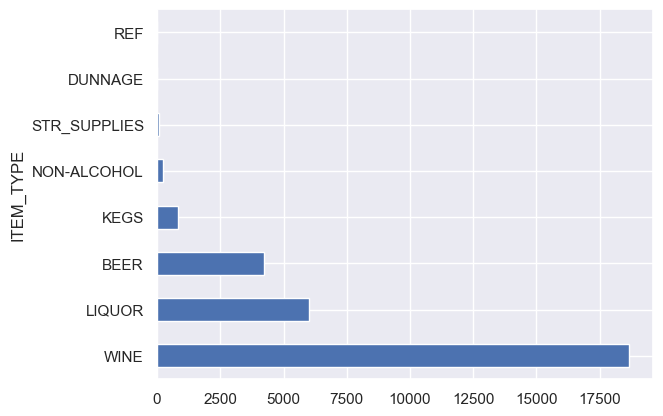

In [29]:
df['ITEM_TYPE'].value_counts().head(10).plot(kind='barh')

In [30]:
df.columns

Index(['YEAR', 'MONTH', 'SUPPLIER', 'ITEM_CODE', 'ITEM_DESCRIPTION',
       'ITEM_TYPE', 'RETAIL_SALES', 'RETAIL_TRANSFERS', 'WAREHOUSE_SALES'],
      dtype='object')

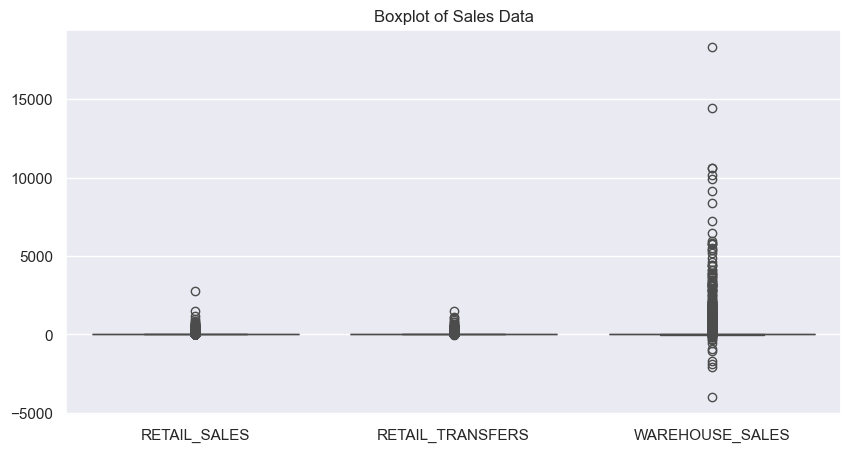

In [31]:
import seaborn as sns
plt.figure(figsize=(10, 5))
sns.boxplot(data=df[['RETAIL_SALES', 'RETAIL_TRANSFERS', 'WAREHOUSE_SALES']])
plt.title("Boxplot of Sales Data")
plt.show()


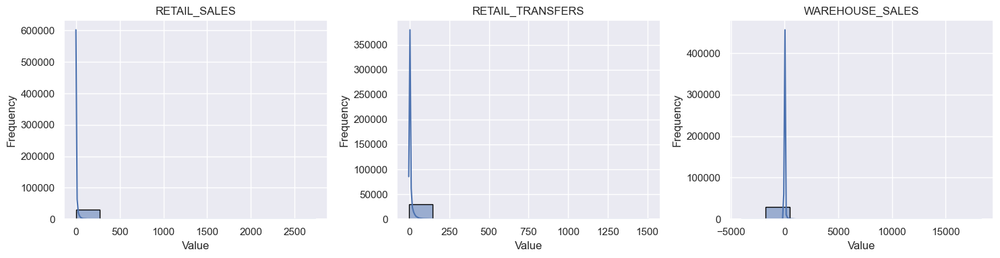

In [32]:
import seaborn as sns
import matplotlib.pyplot as plt

cols = ['RETAIL_SALES', 'RETAIL_TRANSFERS', 'WAREHOUSE_SALES']
plt.figure(figsize=(15, 4))

for i, col in enumerate(cols):
    plt.subplot(1, 3, i + 1)
    sns.histplot(df[col], bins=10, kde=True, edgecolor='black')
    plt.title(col)
    plt.xlabel("Value")
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()



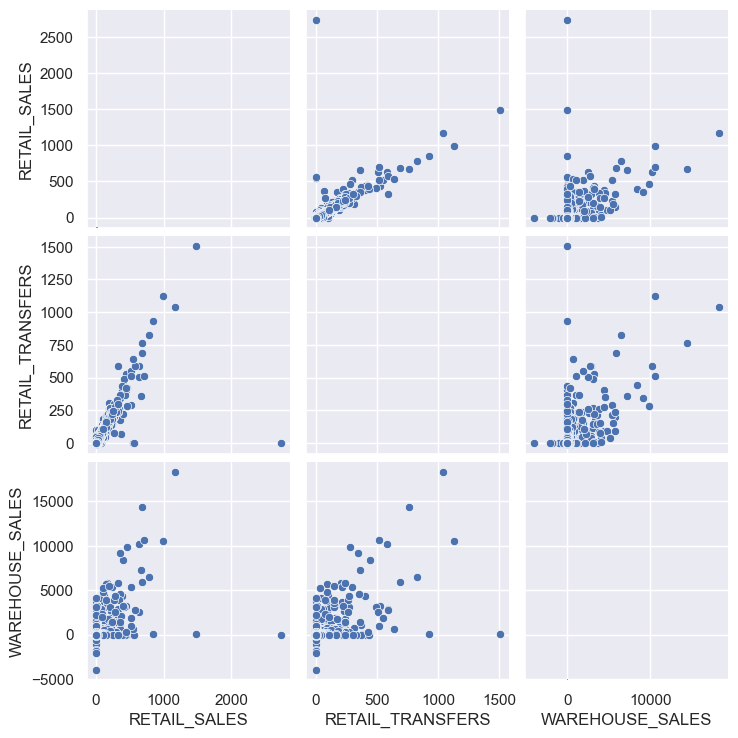

In [33]:
sns.pairplot(df[['RETAIL_SALES', 'RETAIL_TRANSFERS', 'WAREHOUSE_SALES']])
plt.show()


In [34]:
#Outlier Removal

In [35]:
q1 = df['RETAIL_SALES'].quantile(0.1)
q99 = df['RETAIL_SALES'].quantile(0.99)
df = df[(df['RETAIL_SALES'] >= q1) & (df['RETAIL_SALES'] <= q99)]

In [36]:
cols = ['WAREHOUSE_SALES', 'RETAIL_TRANSFERS']

for col in cols:
    q1 = df[col].quantile(0.10)
    q99 = df[col].quantile(0.99)
    df = df[(df[col] >= q1) & (df[col] <= q99)]


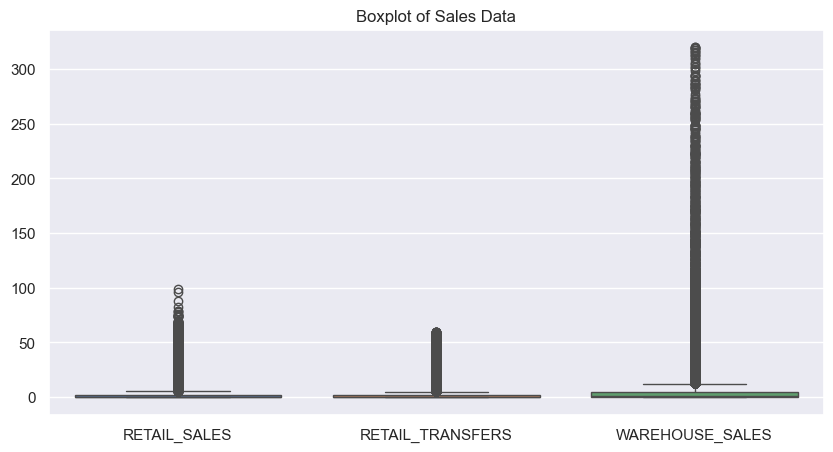

In [37]:
import seaborn as sns
plt.figure(figsize=(10, 5))
sns.boxplot(data=df[['RETAIL_SALES', 'RETAIL_TRANSFERS', 'WAREHOUSE_SALES']])
plt.title("Boxplot of Sales Data")
plt.show()

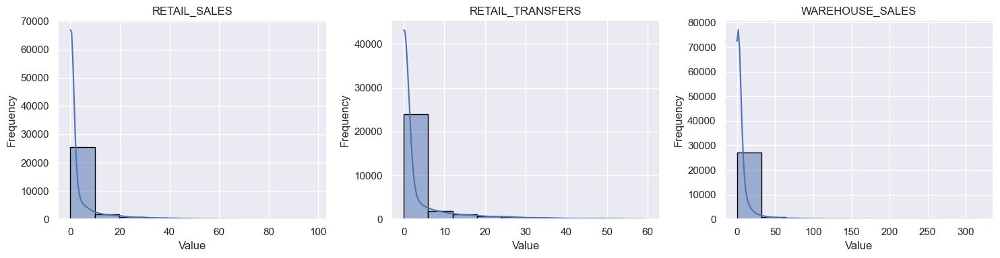

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt

cols = ['RETAIL_SALES', 'RETAIL_TRANSFERS', 'WAREHOUSE_SALES']
plt.figure(figsize=(15, 4))

for i, col in enumerate(cols):
    plt.subplot(1, 3, i + 1)
    sns.histplot(df[col], bins=10, kde=True, edgecolor='black')
    plt.title(col)
    plt.xlabel("Value")
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

In [39]:
df.isna().sum()

YEAR                0
MONTH               0
SUPPLIER            0
ITEM_CODE           0
ITEM_DESCRIPTION    0
ITEM_TYPE           0
RETAIL_SALES        0
RETAIL_TRANSFERS    0
WAREHOUSE_SALES     0
dtype: int64

In [40]:
corr_matrix = df[['RETAIL_SALES', 'RETAIL_TRANSFERS', 'WAREHOUSE_SALES']].corr()
corr_matrix

,RETAIL_SALES,RETAIL_TRANSFERS,WAREHOUSE_SALES
RETAIL_SALES,1.000000,0.934231,0.316257
RETAIL_TRANSFERS,0.934231,1.000000,0.311587
WAREHOUSE_SALES,0.316257,0.311587,1.000000


In [41]:
'''RETAIL_SALES and RETAIL_TRANSFERS are highly correlated (0.91) → likely represent similar retail behavior
WAREHOUSE_SALES is weakly correlated with both → behaves differently from retail operations.
Multicollinearity risk between RETAIL_SALES & RETAIL_TRANSFERS in linear models.
but we drop it later using after feature importance
'''

'RETAIL_SALES and RETAIL_TRANSFERS are highly correlated (0.91) → likely represent similar retail behavior\nWAREHOUSE_SALES is weakly correlated with both → behaves differently from retail operations.\nMulticollinearity risk between RETAIL_SALES & RETAIL_TRANSFERS in linear models.\nbut we drop it later using after feature importance\n'

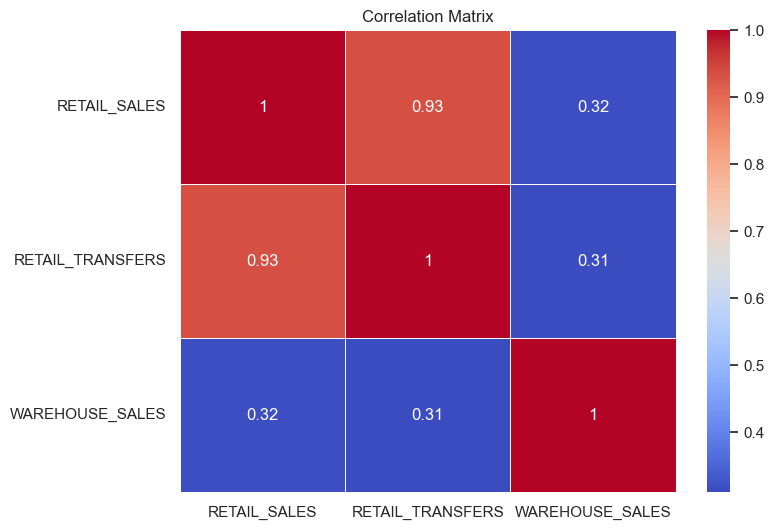

In [42]:
plt.figure(figsize=(8,6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

In [43]:
!pip install plotly

In [44]:
import plotly.express as px

In [45]:
df.columns

Index(['YEAR', 'MONTH', 'SUPPLIER', 'ITEM_CODE', 'ITEM_DESCRIPTION',
       'ITEM_TYPE', 'RETAIL_SALES', 'RETAIL_TRANSFERS', 'WAREHOUSE_SALES'],
      dtype='object')

In [46]:
cols=['YEAR',"MONTH"]

In [47]:
for i in cols:
    counts = df[i].value_counts()
    fig = px.pie(counts, values=counts.values, names=counts.index, title=f'Distribution of {i}')
    fig.show()

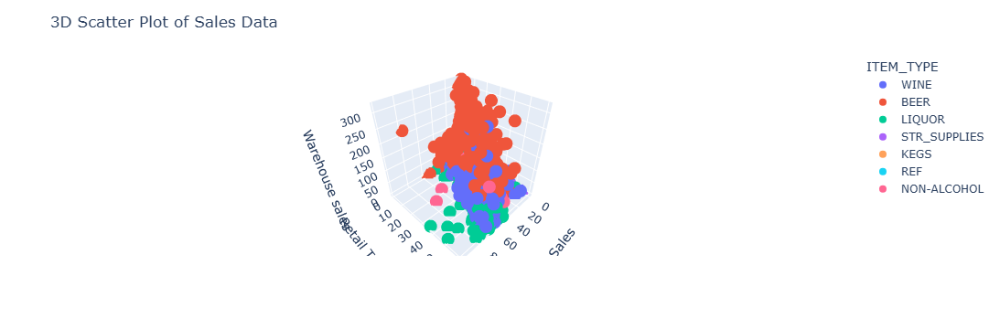

In [48]:
fig = px.scatter_3d(df, x='RETAIL_SALES', y = 'RETAIL_TRANSFERS', z='WAREHOUSE_SALES', color='ITEM_TYPE')
fig.update_layout(title='3D Scatter Plot of Sales Data', scene = dict(xaxis_title="Retail Sales", 
                                                                      yaxis_title="Retail Transfers",
                                                                      zaxis_title = "Warehouse sales"))
fig.show()

In [49]:
pivot_table = pd.pivot_table(df, values = 'RETAIL_SALES', index = ['YEAR', 'MONTH'],
                             columns = ['ITEM_TYPE'], aggfunc='sum', fill_value=0)

In [50]:
pivot_table

ITEM_TYPE      BEER  KEGS    LIQUOR  NON-ALCOHOL    REF  STR_SUPPLIES  \
YEAR MONTH                                                              
2020 1      5026.70   0.0  17643.71       761.66  16.10        105.71   
     3      2996.14   0.0   6660.82       143.67  22.08         78.53   
     7      7505.90   0.0  19272.85      1160.29   8.17         81.23   
     9       300.31   0.0   1667.65       120.57   0.00         32.41   

ITEM_TYPE       WINE  
YEAR MONTH            
2020 1      20546.85  
     3       6355.72  
     7      20093.23  
     9       1212.34

In [51]:
pivot_table = pd.pivot_table(df, values = 'RETAIL_TRANSFERS', index = ['YEAR', 'MONTH'],
                             columns = ['ITEM_TYPE'], aggfunc='sum', fill_value=0)
pivot_table

ITEM_TYPE      BEER  KEGS    LIQUOR  NON-ALCOHOL   REF  STR_SUPPLIES      WINE
YEAR MONTH                                                                    
2020 1      5834.00   0.0  17784.61       834.75  25.0         204.0  20450.08
     3      2919.00   0.0   6926.86       138.00   0.0          52.0   6203.36
     7      5572.25   0.0  17725.66      1068.00   9.0         225.0  19574.75
     9       185.00   0.0   1563.60        96.33   0.0          12.0   1201.80

In [52]:
pivot_table = pd.pivot_table(df, values = ['RETAIL_TRANSFERS','RETAIL_SALES'], index = ['YEAR', 'MONTH'],
                             columns = ['ITEM_TYPE'], aggfunc='sum', fill_value=0)
pivot_table

RETAIL_SALES                                                 \
ITEM_TYPE          BEER KEGS    LIQUOR NON-ALCOHOL    REF STR_SUPPLIES   
YEAR MONTH                                                               
2020 1          5026.70  0.0  17643.71      761.66  16.10       105.71   
     3          2996.14  0.0   6660.82      143.67  22.08        78.53   
     7          7505.90  0.0  19272.85     1160.29   8.17        81.23   
     9           300.31  0.0   1667.65      120.57   0.00        32.41   

                     RETAIL_TRANSFERS                                   \
ITEM_TYPE       WINE             BEER KEGS    LIQUOR NON-ALCOHOL   REF   
YEAR MONTH                                                               
2020 1      20546.85          5834.00  0.0  17784.61      834.75  25.0   
     3       6355.72          2919.00  0.0   6926.86      138.00   0.0   
     7      20093.23          5572.25  0.0  17725.66     1068.00   9.0   
     9       1212.34           185.00  0.0   1563.60       96.33   0.0   

                                   
ITEM_TYPE  STR_SUPPLIES      WINE  
YEAR MONTH                         
2020 1            204.0  20450.08  
     3             52.0   6203.36  
     7            225.0  19574.75  
     9             12.0   1201.80

In [53]:
correlation_matrix = corr_matrix
correlation_matrix

,RETAIL_SALES,RETAIL_TRANSFERS,WAREHOUSE_SALES
RETAIL_SALES,1.000000,0.934231,0.316257
RETAIL_TRANSFERS,0.934231,1.000000,0.311587
WAREHOUSE_SALES,0.316257,0.311587,1.000000


In [54]:
#Method-1

In [55]:
threshold = 0.80 # Business will provide you
highly_correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = correlation_matrix.columns[i]
            highly_correlated_features.add(colname)
            highly_correlated_features.add(correlation_matrix.columns[j])

In [56]:
highly_correlated_features

{'RETAIL_SALES', 'RETAIL_TRANSFERS'}

In [57]:
#Method-2

In [58]:
threshold = 0.80
corr_matrix = df.corr(numeric_only=True)
highly_corr = []

for col in corr_matrix.columns:
    for row in corr_matrix.index:
        if col != row and abs(corr_matrix.loc[row, col]) > threshold:
            highly_corr.append((row, col))


In [59]:
features_to_drop = set([item for pair in highly_corr for item in pair])
print(features_to_drop)

{'RETAIL_TRANSFERS', 'RETAIL_SALES'}


In [60]:
# dont remove one feature immediately

In [61]:
df = df[['YEAR', 'MONTH', 'SUPPLIER', 'ITEM_TYPE', 'RETAIL_SALES','RETAIL_TRANSFERS', 'WAREHOUSE_SALES']]
df.head()

,YEAR,MONTH,SUPPLIER,ITEM_TYPE,RETAIL_SALES,RETAIL_TRANSFERS,WAREHOUSE_SALES
0,2020,1,REPUBLIC NATIONAL DISTRIBUTING CO,WINE,0.00,0.0,2.0
1,2020,1,PWSWN INC,WINE,0.00,1.0,4.0
2,2020,1,RELIABLE CHURCHILL LLLP,BEER,0.00,0.0,1.0
3,2020,1,LANTERNA DISTRIBUTORS INC,WINE,0.00,0.0,1.0
4,2020,1,DIONYSOS IMPORTS INC,WINE,0.82,0.0,0.0


In [62]:
# we can use Pycaret to choose best clustering algo but i ma not using it
# for pure RFM clustering, you typically don’t need regression first.

In [ ]:
'''Why do transformation even after removing outliers?
Outlier removal only trims extremes, but it may not fix skewness.
Many ML models (especially linear models, KNN, logistic regression, etc.) assume that features are 
normally distributed or at least symmetric.
If the KDE plot is heavily right- or left-skewed, transformations like log, sqrt, or Box-Cox can help 
stabilize variance and improve model performance.

Transformation	Use when
log1p(x)	      Right-skewed, all positive or shifted positive
sqrt(x)	          Mild skewness
boxcox(x)	      When you want to test optimal power transformation
yeojohnson(x)	  Like Box-Cox, but works with negative values

'''

In [72]:
df['RETAIL_SALES'].min()

0.0

In [66]:
# 1. Identify the minimum value across the three sales-related columns
min_value = df[['RETAIL_SALES', 'WAREHOUSE_SALES', 'RETAIL_TRANSFERS']].min()
print(min_value)
max_value = df[['RETAIL_SALES', 'WAREHOUSE_SALES', 'RETAIL_TRANSFERS']].max()
print(max_value)

RETAIL_SALES        0.0
WAREHOUSE_SALES     0.0
RETAIL_TRANSFERS    0.0
dtype: float64
RETAIL_SALES         98.44
WAREHOUSE_SALES     320.00
RETAIL_TRANSFERS     60.00
dtype: float64


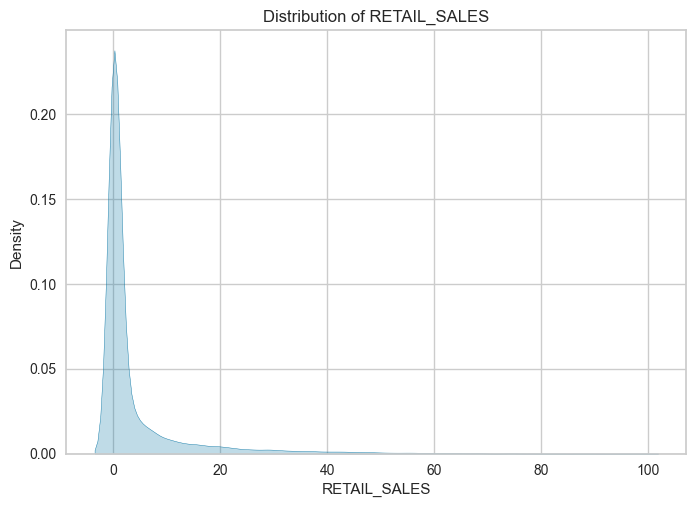

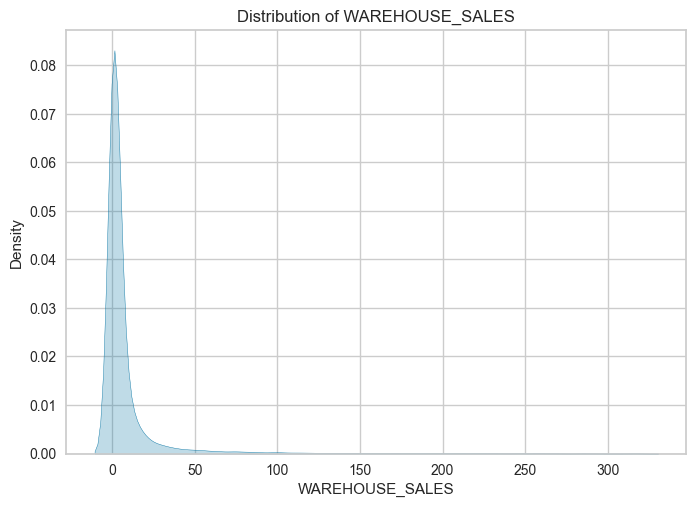

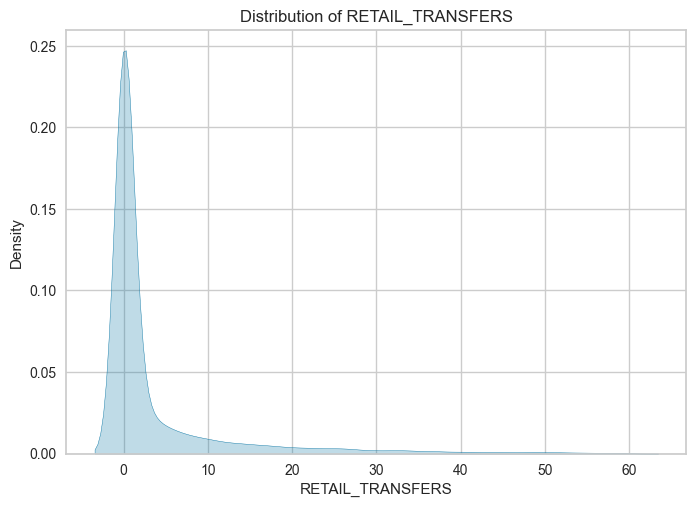

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

for col in ['RETAIL_SALES', 'WAREHOUSE_SALES', 'RETAIL_TRANSFERS']:
    sns.kdeplot(df[col], shade=True)
    plt.title(f'Distribution of {col}')
    plt.show()


In [ ]:
# Long Tail in right so log transformation

In [ ]:
'''constant	Implied min_value	Meaning
  1	          0	                Column has 0s, so add 1 for log
  4000	     -3999	            Column has large negatives → needs fix or shift'''

In [73]:
# 2. Add a constant to handle zeros or negative values
#min_value1 = df[['RETAIL_SALES', 'WAREHOUSE_SALES', 'RETAIL_TRANSFERS']].min().min()
min_value1 = df[['RETAIL_SALES', 'WAREHOUSE_SALES']].min().min()
constant = abs(min_value1) + 1 if min_value1 <=0 else 0
constant

1.0

In [75]:
# 3. Apply log1p transformation
df1 = df.copy()  # Work on a copy to keep original intact
df1['Log_Retail_Sales'] = np.log1p(df1['RETAIL_SALES'] + constant)
df1['Log_Warehouse_Sales'] = np.log1p(df1['WAREHOUSE_SALES'] + constant)
df1['Log_Retail_Transfers'] = np.log1p(df1['RETAIL_TRANSFERS'] + constant)


In [76]:
# 4. Optional: Check the transformed value ranges
print("Log_Retail_Sales:", df1['Log_Retail_Sales'].min(), "to", df1['Log_Retail_Sales'].max())
print("Log_Warehouse_Sales:", df1['Log_Warehouse_Sales'].min(), "to", df1['Log_Warehouse_Sales'].max())
print("Log_Retail_Transfers:", df1['Log_Retail_Transfers'].min(), "to", df1['Log_Retail_Transfers'].max())


Log_Retail_Sales: 0.6931471805599453 to 4.609560534289384
Log_Warehouse_Sales: 0.6931471805599453 to 5.7745515455444085
Log_Retail_Transfers: 0.6931471805599453 to 4.127134385045092


In [ ]:
'''exp(0.69) ≈ 2 exp(4.60) ≈ 99 So your original RETAIL_SALES values were likely in the range of 2 to 99, 
meaning: You removed outliers or negative values properly before log transformation'''

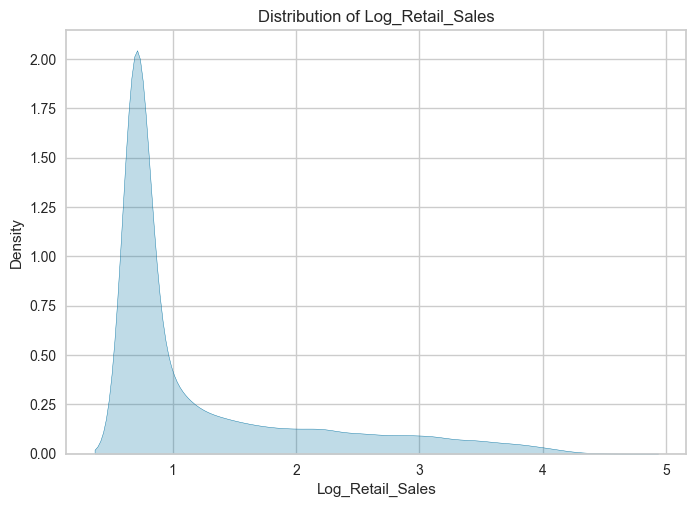

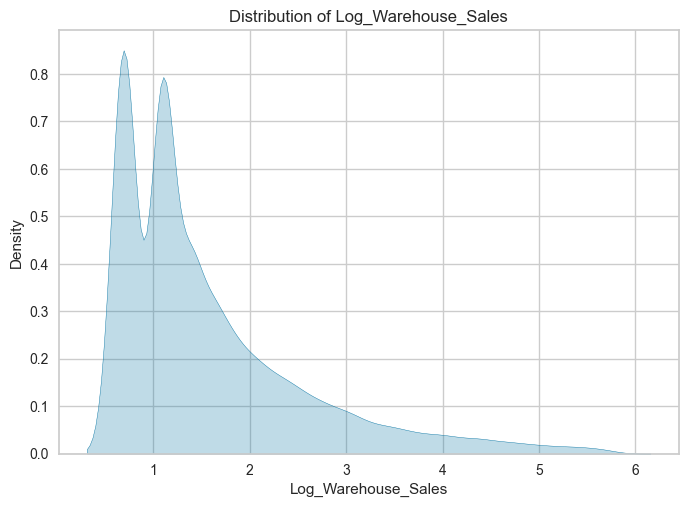

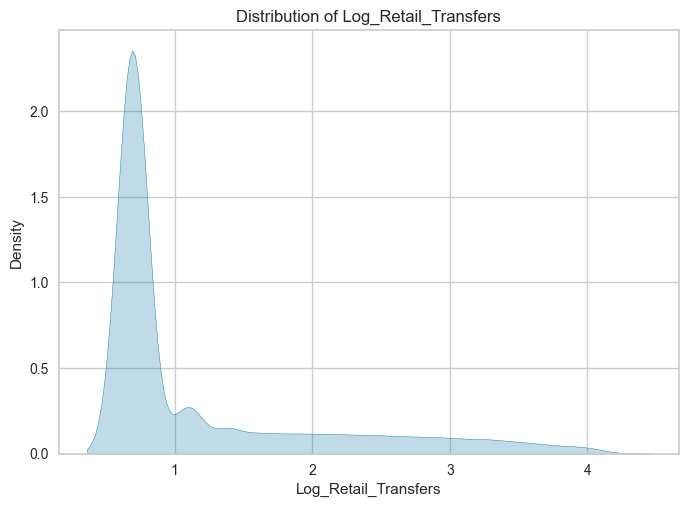

In [80]:
import seaborn as sns
import matplotlib.pyplot as plt

for col in ['Log_Retail_Sales', 'Log_Warehouse_Sales', 'Log_Retail_Transfers']:
    sns.kdeplot(df1[col], shade=True)
    plt.title(f'Distribution of {col}')
    plt.show()


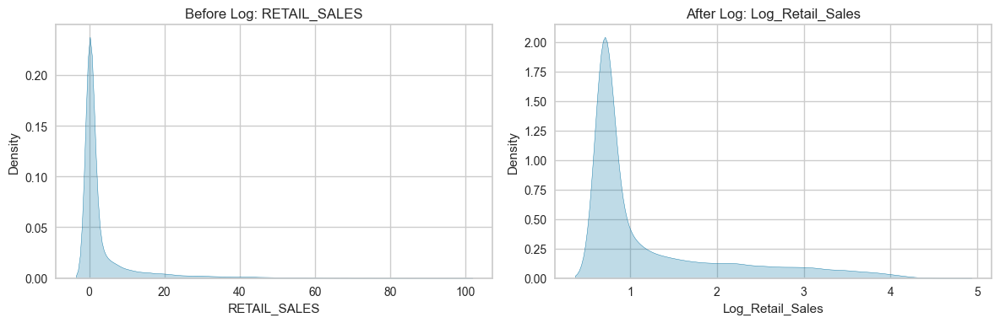

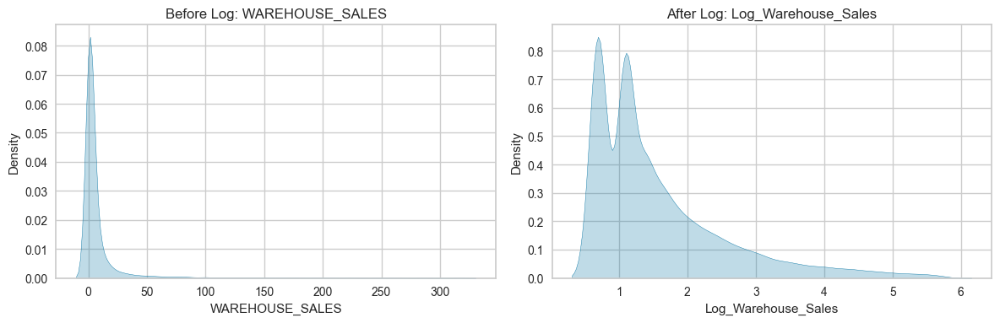

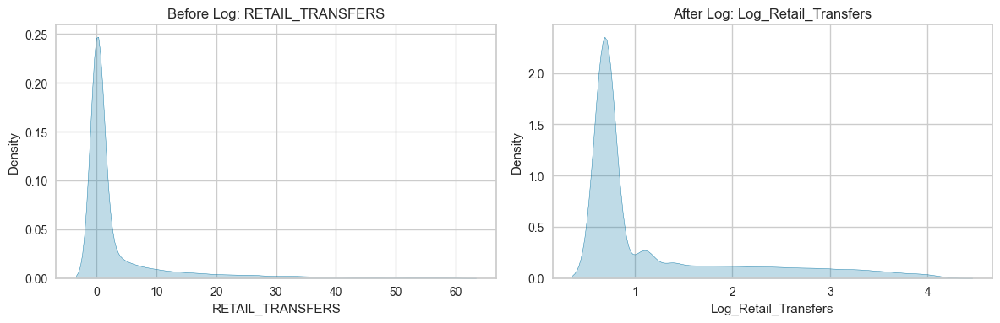

In [81]:
import seaborn as sns
import matplotlib.pyplot as plt

original_cols = ['RETAIL_SALES', 'WAREHOUSE_SALES', 'RETAIL_TRANSFERS']
log_cols = ['Log_Retail_Sales', 'Log_Warehouse_Sales', 'Log_Retail_Transfers']

for orig, log in zip(original_cols, log_cols):
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # Before log transformation
    sns.kdeplot(df[orig], shade=True, ax=axes[0])
    axes[0].set_title(f'Before Log: {orig}')

    # After log transformation
    sns.kdeplot(df1[log], shade=True, ax=axes[1])
    axes[1].set_title(f'After Log: {log}')

    plt.tight_layout()
    plt.show()


In [118]:
df1.columns

Index(['YEAR', 'MONTH', 'SUPPLIER', 'ITEM_TYPE', 'RETAIL_SALES',
       'RETAIL_TRANSFERS', 'WAREHOUSE_SALES', 'Log_Retail_Sales',
       'Log_Warehouse_Sales', 'Log_Retail_Transfers', 'Cluster'],
      dtype='object')

In [ ]:
'''Pseudo-RFM means creating RFM-style features (Recency, Frequency, Monetary) even when you don’t have 
proper transactional data like CustomerID, InvoiceNo, or InvoiceDate.
Instead, you adapt the concept using whatever structure your data has

RFM Component	Real RFM Meaning	Pseudo-RFM (Example from your data)
Recency (R)	    How recently a customer made a purchase	How recently a SUPPLIER sold an item (based on latest YEAR & MONTH)
Frequency (F)	How often they bought	                Number of months the SUPPLIER appeared in sales records
Monetary (M)	How much money they spent	            Total RETAIL_SALES or WAREHOUSE_SALES from the SUPPLIER


'''

In [ ]:
# Segment Supplier based on RFM

In [119]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler

# Choose one: original or log-transformed features
numerical_cols = ['Log_Retail_Sales', 'Log_Warehouse_Sales']  # Or use original if not skewed
categorical_cols = ['SUPPLIER', 'ITEM_TYPE']

preprocessor = ColumnTransformer(transformers=[
    ('cat', OneHotEncoder(), categorical_cols),
    ('num', StandardScaler(), numerical_cols)
])


In [120]:
preprocessor

ColumnTransformer(transformers=[('cat', OneHotEncoder(),
                                 ['SUPPLIER', 'ITEM_TYPE']),
                                ('num', StandardScaler(),
                                 ['Log_Retail_Sales', 'Log_Warehouse_Sales'])])

In [145]:
X_transformed = preprocessor.fit_transform(df1)

from scipy.sparse import issparse
print("Is sparse:", issparse(X_transformed))

Is sparse: True


In [ ]:
#pipeline.fit_transform(df1)
#This fits the pipeline and returns the transformed output (i.e., the result after PCA/SVD if included).
#Use this when you want to visualize, analyze, or store the transformed data

In [127]:
from sklearn.decomposition import TruncatedSVD
# Replace PCA with TruncatedSVD
svd = TruncatedSVD(n_components=2, random_state=42)

In [132]:
x_processed=pipeline.fit_transform(df1)
x_processed

array([[3.46237015, 0.42317342, 1.16837641, 2.47381434],
       [3.16798939, 0.75040772, 0.810462  , 2.54308377],
       [3.47654106, 0.10817212, 1.4039322 , 2.05071193],
       ...,
       [3.94348424, 0.41803692, 1.77870512, 2.4098489 ],
       [2.99377149, 1.00752785, 0.60370773, 2.64181605],
       [3.66700867, 0.30921098, 1.41340145, 2.4646296 ]])

In [ ]:
#X = df[categorical_cols + numerical_cols]
#X_processed = preprocessor.fit_transform(X)

In [ ]:
'''KMeans++ is already the default initialization method in sklearn's KMeans'''

In [133]:
from sklearn.cluster import KMeans
inertia = []
K_range = range(1,11)
for k in K_range:
    #kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=0)

    kmeans.fit(x_processed)
    inertia.append(kmeans.inertia_)

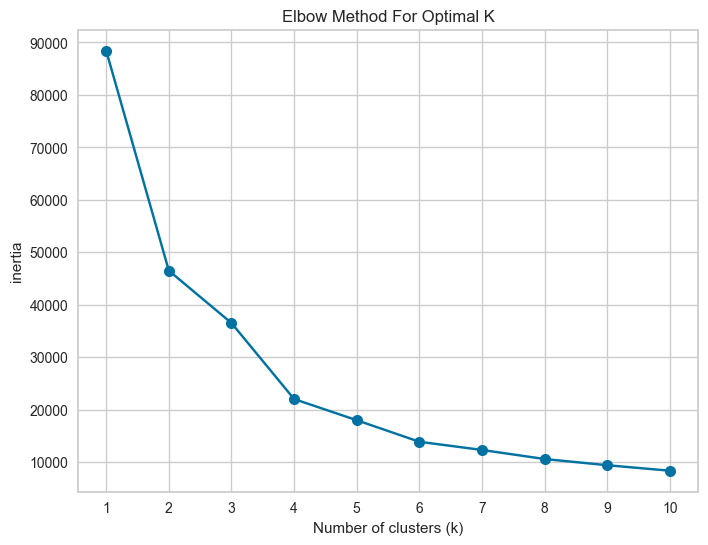

In [134]:
plt.figure(figsize=(8,6))
plt.plot(K_range, inertia, 'bo-', markersize=8)
plt.xlabel("Number of clusters (k)")
plt.ylabel("inertia")
plt.title("Elbow Method For Optimal K")
plt.xticks(K_range)
plt.grid(True)
plt.show()

In [135]:
# Get the inertia values with k from 1 to 10
for k, inertia in zip(K_range, inertia):
    print(f"k={k}, inertia={inertia}")
    
#the “elbow” point (where the drop in inertia slows down) is usually your best k so its 4 

k=1, inertia=88427.6170815936
k=2, inertia=46496.42433924911
k=3, inertia=36511.926886567264
k=4, inertia=22019.32214118918
k=5, inertia=17983.584791794856
k=6, inertia=13872.262858780308
k=7, inertia=12312.752544878647
k=8, inertia=10584.84681274388
k=9, inertia=9402.638589346492
k=10, inertia=8352.58302370927


In [136]:
from sklearn.metrics import silhouette_score

kmeans = KMeans(n_clusters=4, init='k-means++', random_state=0)
labels = kmeans.fit_predict(x_processed)
score = silhouette_score(x_processed, labels)
print(f"Silhouette Score for k=4: {score}")

# initially my score is .21 and now .50 because of SVD not pca, so pca before clustering

Silhouette Score for k=4: 0.5042381645107296


In [ ]:
'''Don’t discard your RFM model just because of a “not high” silhouette score —
this is a starting point, and RFM is still valuable.'''

In [137]:
clusters = kmeans.fit_predict(x_processed)
df1['Cluster'] = clusters

In [138]:
df1['Cluster'] = clusters
df1.head()

,YEAR,MONTH,SUPPLIER,ITEM_TYPE,RETAIL_SALES,RETAIL_TRANSFERS,WAREHOUSE_SALES,Log_Retail_Sales,Log_Warehouse_Sales,Log_Retail_Transfers,Cluster
0,2020,1,REPUBLIC NATIONAL DISTRIBUTING CO,WINE,0.00,0.0,2.0,0.693147,1.386294,0.693147,3
1,2020,1,PWSWN INC,WINE,0.00,1.0,4.0,0.693147,1.791759,1.098612,3
2,2020,1,RELIABLE CHURCHILL LLLP,BEER,0.00,0.0,1.0,0.693147,1.098612,0.693147,3
3,2020,1,LANTERNA DISTRIBUTORS INC,WINE,0.00,0.0,1.0,0.693147,1.098612,0.693147,3
4,2020,1,DIONYSOS IMPORTS INC,WINE,0.82,0.0,0.0,1.036737,0.693147,0.693147,3


In [139]:
df1['Cluster'].unique()

array([3, 2, 0, 1])

In [140]:
df1['Cluster'].value_counts()

Cluster
3    16954
2     5807
0     3602
1     2651
Name: count, dtype: int64

In [ ]:
# we shouldn't name the clusters blindly. We need to analyze the characteristics of each 
# cluster using groupby() and mean() or median() of key metrics

In [153]:
df1.groupby("Cluster")[["Log_Retail_Sales", "Log_Warehouse_Sales", "Log_Retail_Transfers"]].mean().round(2)


,Log_Retail_Sales,Log_Warehouse_Sales,Log_Retail_Transfers
Cluster,,,
0,2.46,0.90,2.28
1,2.63,3.84,2.61
2,1.11,2.35,1.11
3,0.80,1.10,0.78


NameError: name 'df_vis' is not defined

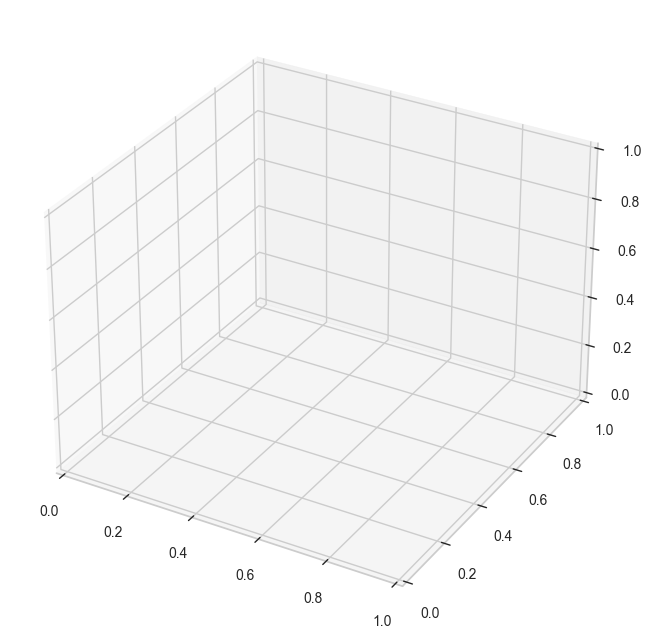

In [168]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(df_vis["Log_Retail_Sales"],
                     df_vis["Log_Warehouse_Sales"],
                     df_vis["Log_Retail_Transfers"],
                     c=df_vis["Cluster"], cmap='viridis', s=60, alpha=0.7)

# Annotate cluster centers
centroids = kmeans.cluster_centers_
ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2],
           c='red', s=200, marker='X', label='Centroids')

ax.set_xlabel("Log_Retail_Sales")
ax.set_ylabel("Log_Warehouse_Sales")
ax.set_zlabel("Log_Retail_Transfers")
ax.set_title("3D Cluster Visualization with Group Labels")
ax.legend()
plt.show()


In [154]:
cluster_labels = {
    1: "High Performer Suppliers",               # Best across all
    0: "Retail-focused Suppliers",               # Good in retail, weak in warehouse
    2: "Warehouse-focused Suppliers",            # Moderate warehouse only
    3: "Low Performer Suppliers"                 # Lowest across the board
}

df1["Group_Name"] = df1["Cluster"].map(cluster_labels)
df1["Group_Name"]

0            Low Performer Suppliers
1            Low Performer Suppliers
2            Low Performer Suppliers
3            Low Performer Suppliers
4            Low Performer Suppliers
                    ...             
29994        Low Performer Suppliers
29995        Low Performer Suppliers
29996        Low Performer Suppliers
29997    Warehouse-focused Suppliers
29999        Low Performer Suppliers
Name: Group_Name, Length: 29014, dtype: object

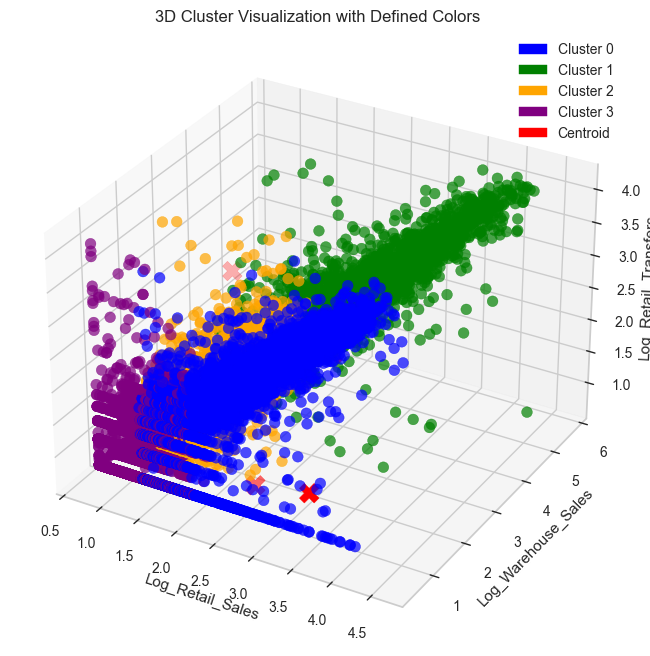

In [171]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.patches as mpatches

# Define fixed color map for clusters
cluster_colors = {
    0: 'blue',
    1: 'green',
    2: 'orange',
    3: 'purple'
}

# Apply color based on cluster
colors = df1["Cluster"].map(cluster_colors)

# Plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(df1["Log_Retail_Sales"],
                     df1["Log_Warehouse_Sales"],
                     df1["Log_Retail_Transfers"],
                     c=colors,
                     s=60, alpha=0.7)

# Annotate centroids
centroids = kmeans.cluster_centers_
ax.scatter(centroids[:, 0], centroids[:, 1], centroids[:, 2],
           c='red', s=200, marker='X', label='Centroids')

ax.set_xlabel("Log_Retail_Sales")
ax.set_ylabel("Log_Warehouse_Sales")
ax.set_zlabel("Log_Retail_Transfers")
ax.set_title("3D Cluster Visualization with Defined Colors")

# Custom legend for clusters
patches = [mpatches.Patch(color=color, label=f'Cluster {key}') for key, color in cluster_colors.items()]
patches.append(mpatches.Patch(color='red', label='Centroid'))
ax.legend(handles=patches)

plt.show()




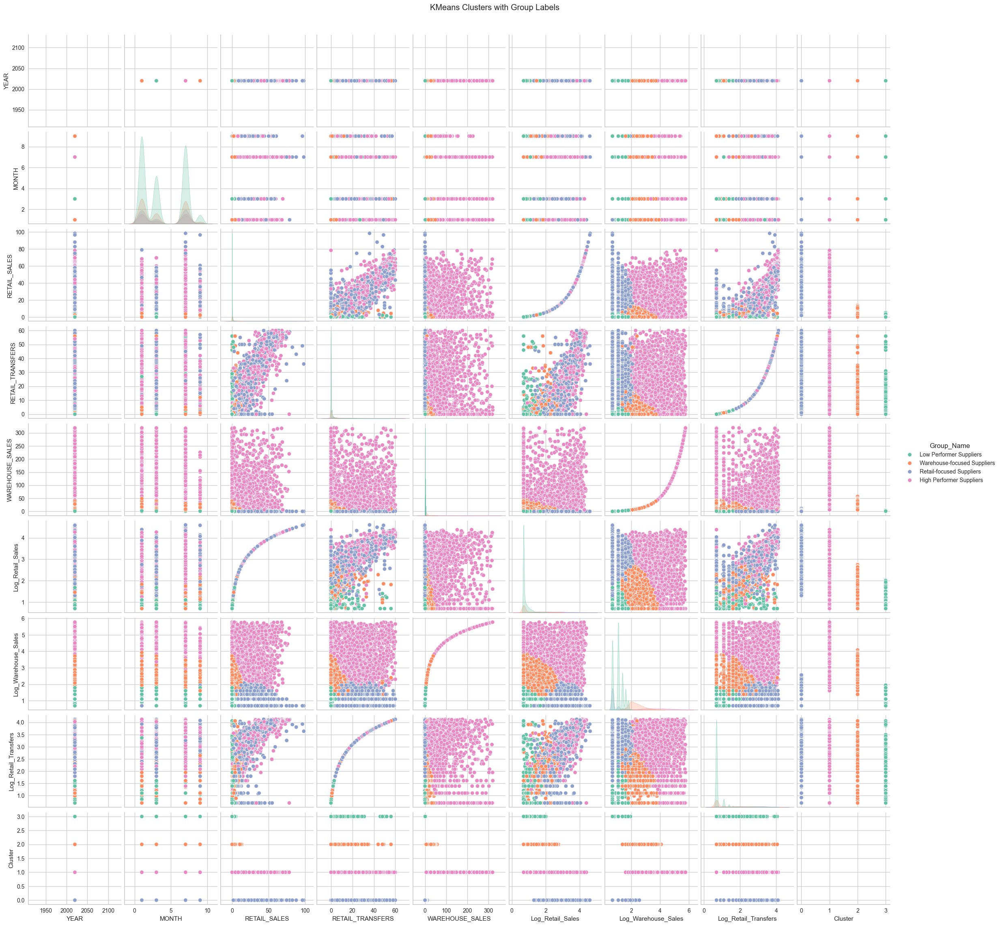

In [170]:
import seaborn as sns

sns.pairplot(df1, hue="Group_Name", palette="Set2", height=2.5)
plt.suptitle("KMeans Clusters with Group Labels", y=1.02)
plt.show()


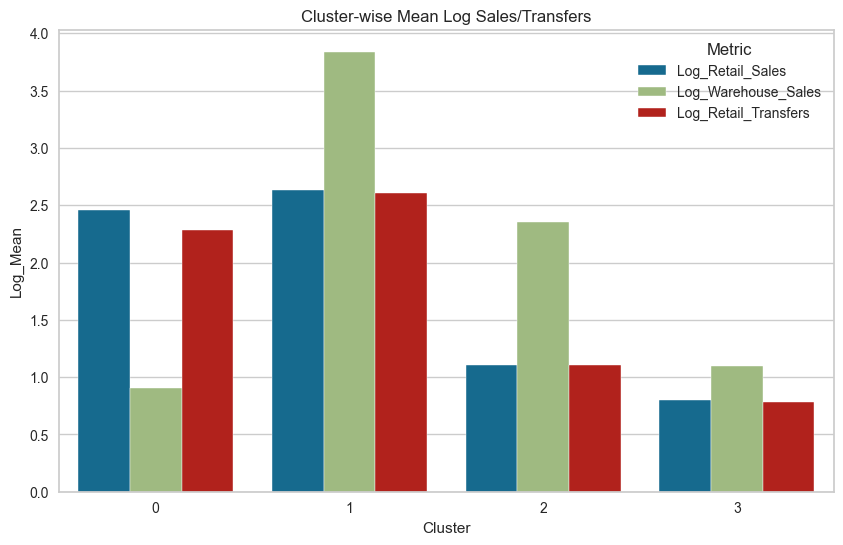

In [156]:
import seaborn as sns
import matplotlib.pyplot as plt

grouped = df1.groupby("Cluster")[["Log_Retail_Sales", "Log_Warehouse_Sales", "Log_Retail_Transfers"]].mean().reset_index()
grouped_melted = grouped.melt(id_vars="Cluster", var_name="Metric", value_name="Log_Mean")

plt.figure(figsize=(10,6))
sns.barplot(x="Cluster", y="Log_Mean", hue="Metric", data=grouped_melted)
plt.title("Cluster-wise Mean Log Sales/Transfers")
plt.show()

    

In [157]:
rfm = df1.groupby("Group_Name").agg({
    "MONTH": "max",               # Recency: how recent the last order was
    "SUPPLIER": "nunique",        # Frequency: how many unique suppliers per group
    "Log_Retail_Sales": "sum"     # Monetary: total value of sales
}).rename(columns={
    "MONTH": "Recency",
    "SUPPLIER": "Frequency",
    "Log_Retail_Sales": "Monetary"
}).reset_index()


In [165]:
rfm

,Group_Name,Recency,Frequency,Monetary,R_rank,F_rank,M_rank,RFM_Score
0,High Performer Suppliers,9,135,6984.902277,2.5,1.0,3.0,6.5
1,Low Performer Suppliers,9,268,13572.017339,2.5,4.0,1.0,7.5
2,Retail-focused Suppliers,9,138,8859.092733,2.5,2.0,2.0,6.5
3,Warehouse-focused Suppliers,9,184,6433.898713,2.5,3.0,4.0,9.5


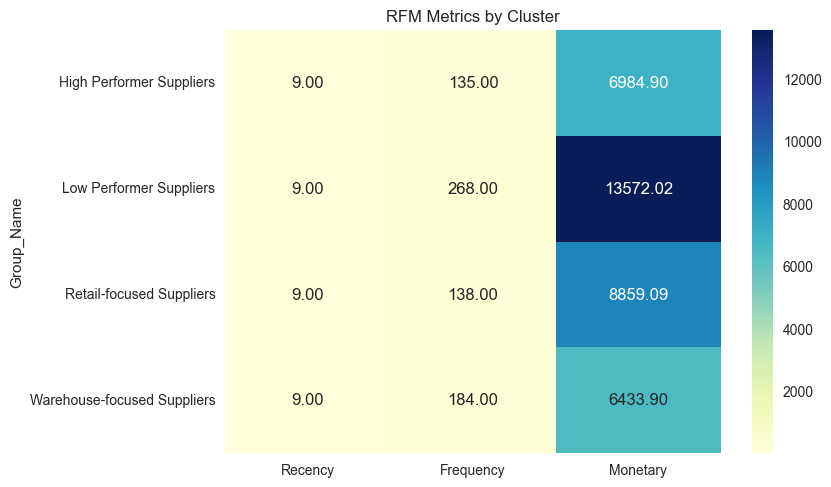

In [160]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(rfm.set_index("Group_Name")[["Recency", "Frequency", "Monetary"]],
            annot=True, cmap="YlGnBu", fmt=".2f")
plt.title("RFM Metrics by Cluster")
plt.show()


In [166]:
#Goal: Find High-Performing Clusters
#To identify high-performing groups (clusters):

performers = rfm.sort_values(["Monetary", "Frequency", "Recency"], ascending=[False, False, False])
print(performers.head())

                    Group_Name  Recency  Frequency      Monetary  R_rank  \
1      Low Performer Suppliers        9        268  13572.017339     2.5   
2     Retail-focused Suppliers        9        138   8859.092733     2.5   
0     High Performer Suppliers        9        135   6984.902277     2.5   
3  Warehouse-focused Suppliers        9        184   6433.898713     2.5   

   F_rank  M_rank  RFM_Score  
1     4.0     1.0        7.5  
2     2.0     2.0        6.5  
0     1.0     3.0        6.5  
3     3.0     4.0        9.5  


In [163]:
rfm['R_rank'] = rfm['Recency'].rank(ascending=False)
rfm['F_rank'] = rfm['Frequency'].rank(ascending=True)
rfm['M_rank'] = rfm['Monetary'].rank(ascending=False)

# Composite score (lower is better)
rfm['RFM_Score'] = rfm['R_rank'] + rfm['F_rank'] + rfm['M_rank']
rfm['RFM_Score']

0    6.5
1    7.5
2    6.5
3    9.5
Name: RFM_Score, dtype: float64